### Import the needed Libraries

#### Documentation: https://pytorch.org/docs/stable/index.html
#### Youtube Tutorial: https://www.learnpytorch.io/
#### Guthub: https://github.com/mrdbourke/pytorch-deep-learning

In [ ]:
# pytorch
import torch
from torch import nn
from torch.utils.data import DataLoader

# torchvision
import torchvision
from torchvision.transforms import ToTensor
from torchvision import datasets, transforms

# torchinfo
%pip install torchinfo
%pip install torchmetrics
from torchinfo import summary

# standard data handling
import pandas as pd
import numpy as np

# plotting
import matplotlib.pyplot as plt
import seaborn as sns

# image
import random
from PIL import Image

# system
from pathlib import Path
import requests
import zipfile
import os

# timing and printing
from tqdm.auto import tqdm
from timeit import default_timer as timer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 8.7 MB/s eta 0:00:00


### Check the available pytorch and Cuda (GPU) Version

In [ ]:
# pytroch and cuda version
print(torch.__version__)

# trochvision and cuda version
print(torchvision.__version__)

2.0.1+cu118
0.15.2+cu118


### Check the available device

1. CPU (Default)
2. Cuda (GPU acceleration is accessible)

In [ ]:
# make device agnostic code (default is cpu)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Available device is: {device}")

Available device is: cpu


### Import Helper files

In [ ]:
# filenames
filenames = {"pytorch_helper_functions.py": "https://raw.githubusercontent.com/sl2000stat/PytorchIntroduction/master/pytorch_helper_functions.py",
             "training.py": "https://raw.githubusercontent.com/sl2000stat/PytorchIntroduction/master/training.py",
             "make_predictions.py":"https://raw.githubusercontent.com/sl2000stat/PytorchIntroduction/master/make_predictions.py",
             "validation.py":"https://raw.githubusercontent.com/sl2000stat/PytorchIntroduction/master/validation.py",
             "visualizing_images.py":"https://raw.githubusercontent.com/sl2000stat/PytorchIntroduction/master/visualizing_images.py"}

for filename, file_path in filenames.items():

  # download helper functions from repo
  if Path(filename).is_file():
    print(f"{filename} already exists. Skipping download")

  else:

    request = requests.get(file_path)
    with open(filename, "wb") as f:
      f.write(request.content)

    print(f"Downloaded {filename}.")

Downloaded pytorch_helper_functions.py.
Downloaded training.py.
Downloaded make_predictions.py.
Downloaded validation.py.
Downloaded visualizing_images.py.


In [ ]:
from pytorch_helper_functions import set_global_seed

# set the global seed
set_global_seed(42)

### General Pytorch Workflow

![](https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/01_a_pytorch_workflow.png)

1. **Getting data ready:** Data can be almost anything but to get started we're going to create a simple straight line
2. **Building a model:**	Here we'll create a model to learn patterns in the data, we'll also choose a loss function, optimizer and build a training loop.
3. **Fitting the model to data (training):** We've got data and a model, now let's let the model (try to) find patterns in the (training) data.
4. **Making predictions and evaluating a model (inference):**	Our model's found patterns in the data, let's compare its findings to the actual (testing) data.
5. **Tune the model:**	Fine tune the hyperparameter and select the optimal model.
6. **Saving and loading a model:**	You may want to use your model elsewhere, or come back to it later, here we'll cover that.


### 2.0 Transfer learning

When using a pretrained model, it's important that your custom data going into the model is prepared in the same way as the original training data that went into the model.

In [ ]:
# use transfer learning
transfer_learning = True

In [ ]:
# optional:
if transfer_learning:

  # choose a model and get a set of pretrained model weights
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT

  # get the transforms used to create our pretrained weights
  auto_transforms = weights.transforms()

  # get the model with the pretrained weights
  model = torchvision.models.efficientnet_b0(weights=weights).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 85.4MB/s]


### 1. Get the Data

In [ ]:
# setup path to data folder
data_path = Path("data/")
image_path = data_path / "pizza_steak_sushi"

# If the image folder doesn't exist, download it and prepare it
if image_path.is_dir():
    print(f"{image_path} directory already exists. Skipping dowload.")
else:
    print(f"Did not find {image_path} directory, creating one.")
    image_path.mkdir(parents=True, exist_ok=True)

    # Download pizza, steak, sushi data
    with open(data_path / "pizza_steak_sushi.zip", "wb") as f:
        request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip")
        print("Downloading the data.")
        f.write(request.content)

    # Unzip pizza, steak, sushi data
    with zipfile.ZipFile(data_path / "pizza_steak_sushi.zip", "r") as zip_ref:
        print("Unzipping the data.")
        zip_ref.extractall(image_path)

    # Remove .zip file
    os.remove(data_path / "pizza_steak_sushi.zip")

Did not find data/pizza_steak_sushi directory, creating one.
Unzipping the data.


In [ ]:
from pytorch_helper_functions import walk_through_directory

# get all the paths
walk_through_directory(image_path)

There are 2 directories and 0 images in 'data/pizza_steak_sushi
There are 3 directories and 0 images in 'data/pizza_steak_sushi/test
There are 0 directories and 31 images in 'data/pizza_steak_sushi/test/sushi
There are 0 directories and 25 images in 'data/pizza_steak_sushi/test/pizza
There are 0 directories and 19 images in 'data/pizza_steak_sushi/test/steak
There are 3 directories and 0 images in 'data/pizza_steak_sushi/train
There are 0 directories and 72 images in 'data/pizza_steak_sushi/train/sushi
There are 0 directories and 78 images in 'data/pizza_steak_sushi/train/pizza
There are 0 directories and 75 images in 'data/pizza_steak_sushi/train/steak


In [ ]:
# set the training and val paths
train_dir = image_path / "train"
val_dir = image_path / "test"

# print
print(f"Train Path: {train_dir} | Test Path: {val_dir}")

Train Path: data/pizza_steak_sushi/train | Test Path: data/pizza_steak_sushi/test


### 1.2 Explore the Image Data

Data Visualization, Preperation and Exploration

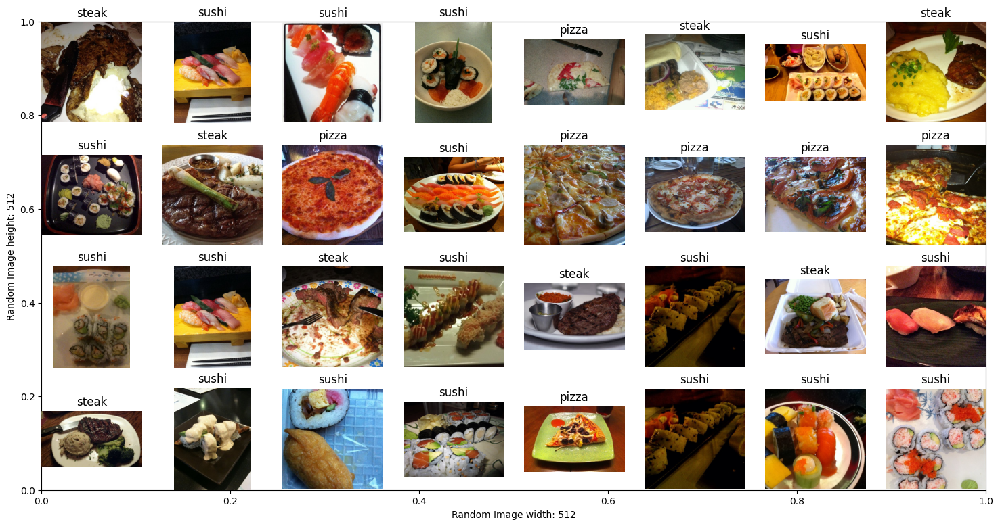

In [ ]:
from visualizing_images import plot_random_images

# get all image paths (* means "any combination")
image_path_list = list(image_path.glob("*/*/*.jpg"))

# visualize random images
plot_random_images(image_path_list)

### 1.3 Convert the Image Data into Tensors

1. Turn it into tensors (numerical representations of our images).
2. Turn it into a torch.utils.data.Dataset and subsequently a torch.utils.data.DataLoader, we'll call these Dataset and DataLoader for short.



### 1.3.1 Data Augmentation and Transform the Data

Create a Data Preparation Pipeline. (https://pytorch.org/vision/stable/transforms.html)

In [ ]:
# Write transform for image
data_transform = transforms.Compose([

    # Resize the images to 64x64
    transforms.Resize(size=(64, 64)),

    # trivial augmentation
    transforms.TrivialAugmentWide(num_magnitude_bins=31),

    # Data Augmentation: Flip the images randomly on the horizontal, p = probability of flip, 0.5 = 50% chance
    transforms.RandomHorizontalFlip(p=0.5),

    # Turn the image into a torch.Tensor, this also converts all pixel values from 0 to 255 to be between 0.0 and 1.0
    transforms.ToTensor()

])

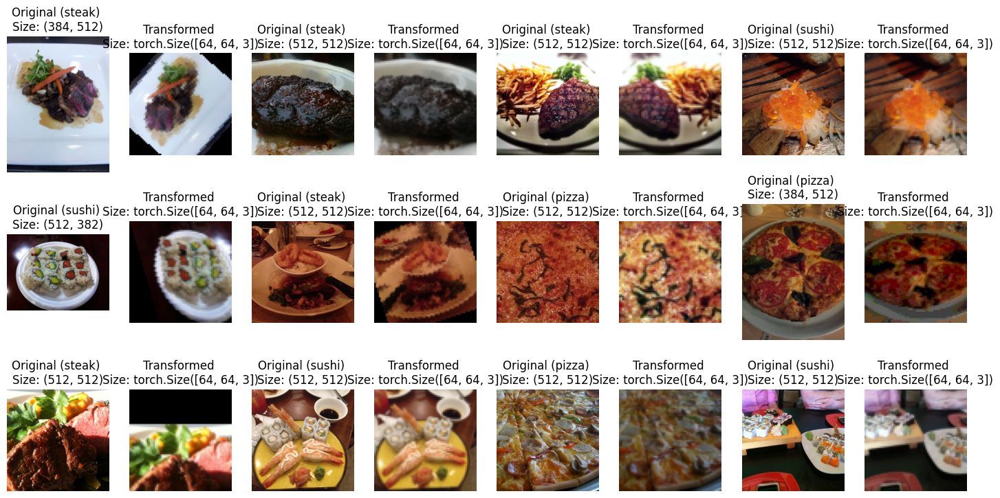

In [ ]:
from visualizing_images import plot_transformed_images

# plot random images with their transformations
plot_transformed_images(image_path_list,data_transform)

### 1.3.2 Loading Image Data into Pytorch Format

In [ ]:
# if using transfer learning use the transform=auto_transforms (can also be done manually and customized)
if transfer_learning:
  transform = auto_transforms
else:
  transform = data_transform

# Use ImageFolder to create train dataset
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=transform,
                                  target_transform=None)

# Use ImageFolder to create validation dataset
val_data = datasets.ImageFolder(root=val_dir,
                                transform=transform,
                                target_transform=None)

print(f"Train data:\n{train_data}\Val data:\n{val_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 225
    Root location: data/pizza_steak_sushi/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BICUBIC
           )\Val data:
Dataset ImageFolder
    Number of datapoints: 75
    Root location: data/pizza_steak_sushi/test
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BICUBIC
           )


### 1.6 Prepare the DataLoader

The DataLoader turns our data into a python iterable and allows us to divide the data into mini batches. (https://pytorch.org/tutorials/beginner/basics/data_tutorial.html)

Why? - computational more efficient & mini batches (size k) give the network more chances to update the gradients per epoch.

In [ ]:
# batch size hyperparameter
BATCH_SIZE = 32

# construct mini batches for the train and test data
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=True)

# check the dimensions
print(f"Length of the train DataLoader: {len(train_dataloader)} batches of {BATCH_SIZE}. (Orignially {len(train_data)})")
print(f"Length of the test DataLoader: {len(val_dataloader)} batches of {BATCH_SIZE}.  (Orignially {len(val_data)})")

Length of the train DataLoader: 8 batches of 32. (Orignially 225)
Length of the test DataLoader: 3 batches of 32.  (Orignially 75)


### 1.5 Check the Data and Extract Key Features

In [ ]:
# class labels
class_names = train_data.classes
print(f"Class Labels: {class_names} | Number of Classes: {len(class_names)}")

Class Labels: ['pizza', 'steak', 'sushi'] | Number of Classes: 3


In [ ]:
# extract an image
img, label = next(iter(train_dataloader))

# image and Label shape after batching
print(f"Image shape: {img.shape} -> [batch_size, color_channels, height, width]")
print(f"Label shape: {label.shape} -> [class]")

Image shape: torch.Size([32, 3, 224, 224]) -> [batch_size, color_channels, height, width]
Label shape: torch.Size([32]) -> [class]


### 2. Build and train your model

1. Build your own model or use an existing architecture
1. Pick a loss function and optimizer

### 2.1 Build your own model or use an existing architecture

1. Build the model (Optional: Transfer learning: adjust classifier)
2. Create a model instance

In [ ]:
# build the model (start with a baseline model and increase the complexity or use an exisiting model architecture)
class PytorchModel(nn.Module):
  """This is the Pytorch Model class. Since it inherits from nn.Module we have to override the forward() method"""

  def __init__(self, input_shape:int,hidden_units:int,output_shape:int):
    """Constructor Initialization. Calls the super constructor and initializes our model."""

    # call the super constructor
    super().__init__()

    # create the model in several blocks

    self.block_1 = nn.Sequential(
        nn.Conv2d(in_channels=input_shape,out_channels=hidden_units, kernel_size=3,stride=1,padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units, kernel_size=3,stride=1,padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
    )


    self.block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units, kernel_size=3,stride=1,padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units, kernel_size=3,stride=1,padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
    )

    self.fully_connceted_layer = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=2560, out_features=output_shape),
    )

  def forward(self,X):
    """
    This function is mandatory in each pytorch model and calculates the foward pass.
    Note: to speed up the training time, don't reassign the values to X (memory intensive).

    :param X: tensor: The X data
    :return y: tensor: The y data (prediction)
    """

    # perform the calculations
    X = self.block_1(X)
    # print(f"Dimension of model output: {X.shape}")
    X = self.block_2(X)
    # print(f"Dimension of model output: {X.shape}")
    X = self.fully_connceted_layer(X)
    # print(f"Dimension of model output: {X.shape}")

    return X


In [ ]:
# if using transfer learning, Recreate the classifier layer and send it to the target device (adjust for output classes)
if transfer_learning:

  # adjust model classifier
  model.classifier = torch.nn.Sequential(torch.nn.Linear(in_features=1280, out_features=len(class_names))).to(device)

  # print
  print(summary(model,input_size=list(img.shape)))

else:

  # Create a model instance of your own model
  model = PytorchModel(input_shape=img.shape[1],hidden_units=10,output_shape = len(class_names))

  # send the model to the right device
  model = model.to(device)

  # print
  print(summary(model,input_size=list(img.shape)))


Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [32, 3]                   --
├─Sequential: 1-1                                       [32, 1280, 7, 7]          --
│    └─Conv2dNormActivation: 2-1                        [32, 32, 112, 112]        --
│    │    └─Conv2d: 3-1                                 [32, 32, 112, 112]        864
│    │    └─BatchNorm2d: 3-2                            [32, 32, 112, 112]        64
│    │    └─SiLU: 3-3                                   [32, 32, 112, 112]        --
│    └─Sequential: 2-2                                  [32, 16, 112, 112]        --
│    │    └─MBConv: 3-4                                 [32, 16, 112, 112]        1,448
│    └─Sequential: 2-3                                  [32, 24, 56, 56]          --
│    │    └─MBConv: 3-5                                 [32, 24, 56, 56]          6,004
│    │    └─MBConv: 3-6                              

In [ ]:
# get a batch of images and labels from the DataLoader
img_batch, label_batch = next(iter(train_dataloader))

# Get a single image from the batch and unsqueeze the image so its shape fits the model
img_single, label_single = img_batch[0].unsqueeze(dim=0), label_batch[0]


# perform a forward pass on a single image
model.eval()
with torch.inference_mode():
    X_dummy = model(img_single.to(device))

# print out what's happening
print(f"Single image shape: {img_single.shape}\n")
print(f"Output logits:\n{X_dummy}\n")

Single image shape: torch.Size([1, 3, 224, 224])

Output logits:
tensor([[ 0.1304, -0.0872,  0.4001]])



### 2.2 Pick a loss function & optimizer

1. Available loss functions: https://pytorch.org/docs/stable/nn.html#loss-functions
2. Available optimizer: https://pytorch.org/docs/stable/optim.html#algorithms



In [ ]:
# experiment tracking
%load_ext tensorboard

# set up a loss function
loss_function = nn.CrossEntropyLoss()

# learning rate
LEARNING_RATE = 0.01

# setup an optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

### 3. Model Training

In [ ]:
from training import training
from pytorch_helper_functions import print_train_time, create_writer

# number of epochs
EPOCHS = 5

# Create a writer
writer = create_writer(experiment_name=f"pizza_steak_sushi",
                               model_name=f"{model.__class__.__name__}",
                               extra=f"epochs_{EPOCHS}")

# timing
train_time_start = timer()

# train and valudation loop
df_scores = training(EPOCHS=EPOCHS, model=model, train_dataloader=train_dataloader,
             val_dataloader=val_dataloader, loss_function=loss_function,
             optimizer=optimizer, epoch_print=2, writer=writer, device=device)

# calculate the training time
train_time_end = timer()
total_train_time = print_train_time(train_time_start, train_time_end, device=str(next(model.parameters()).device))

Created SummaryWriter, saving to: runs/2023-05-31/pizza_steak_sushi/EfficientNet/epochs_5.
Starting training.


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 0
-------
Train Loss: 1.52780 & Accuracy: 0.44141 | Validation Loss:62141.67578 & Accuracy: 0.19508 

Epoch: 2
-------
Train Loss: 1.45030 & Accuracy: 0.37891 | Validation Loss:76.64063 & Accuracy: 0.35985 

Epoch: 4
-------
Train Loss: 1.04941 & Accuracy: 0.48438 | Validation Loss:5.56705 & Accuracy: 0.32008 

Finished training.

Train time on cpu: 447.028 seconds


### 4. Model Evaluation

1. Learning Curve
2. Confusion matrix

In [ ]:
from make_predictions import make_predictions

# make predictions
y_pred_train, y_pred_train_prob, y_true_train = make_predictions(train_dataloader, model=model, device=device)
y_pred_val, y_pred_val_prob, y_true_val = make_predictions(val_dataloader, model=model, device=device)

# combine them into a dataframe
df_predictions_train = pd.DataFrame({"Predictions": y_pred_train,"Predictions Probabilities": y_pred_train_prob,"True Values": y_true_train, "Type": "Train"})
df_predictions_val = pd.DataFrame({"Predictions": y_pred_val,"Predictions Probabilities": y_pred_val_prob,"True Values": y_true_val, "Type": "Val"})

# combine the dataframes
df_predictions = pd.concat([df_predictions_train,df_predictions_val])

### 4.1 Plot the training and validation Learning curves

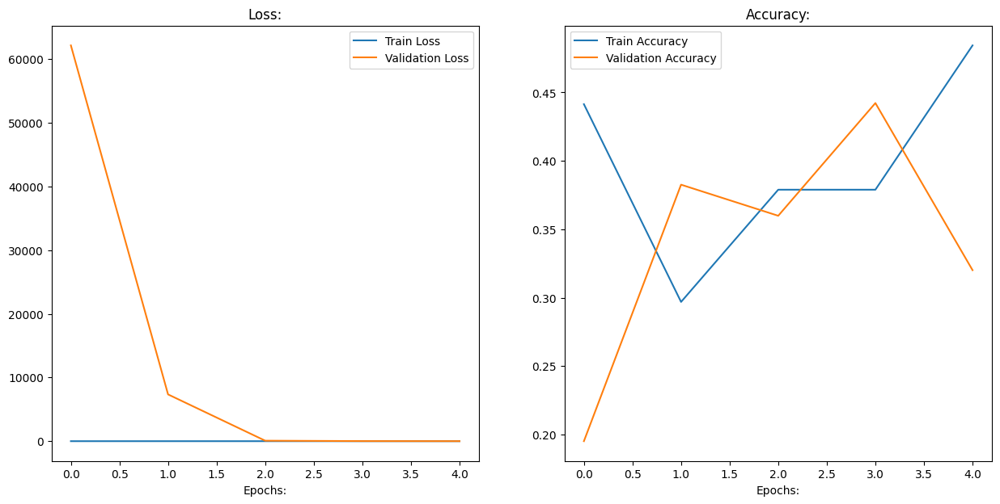

In [ ]:
from validation import plot_loss_curve

# plot the loss and accuracy curve
plot_loss_curve(df_scores)

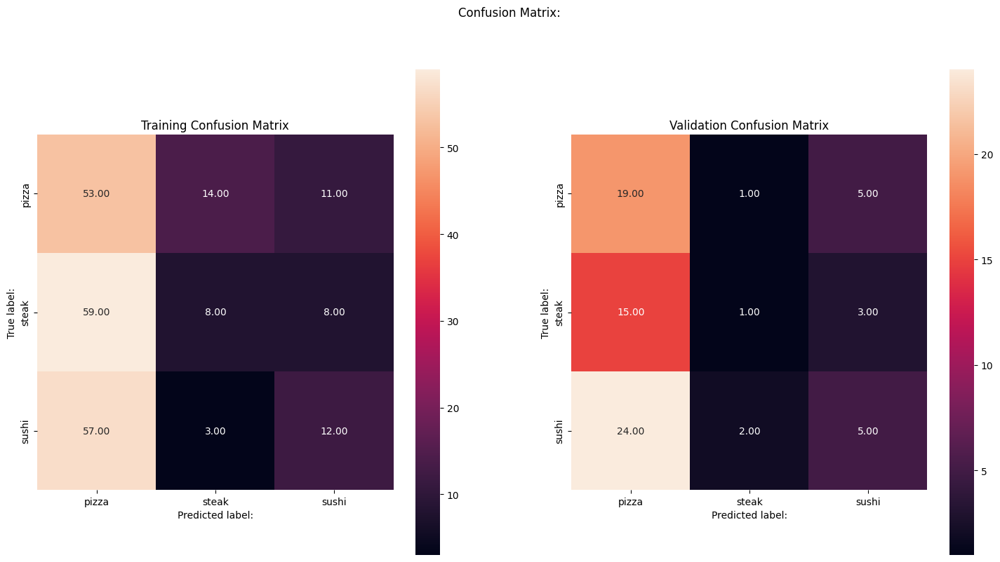

In [ ]:
from validation import get_confusionmatrix

# confusion matrixes
get_confusionmatrix(df_predictions_train["Predictions"], df_predictions_train["True Values"],
                        df_predictions_val["Predictions"], df_predictions_val["True Values"],
                        class_names=class_names)


In [ ]:
#print(f"Output prediction probabilities:\n{torch.softmax(X_dummy, dim=1)}\n")
#print(f"Output prediction label:\n{torch.argmax(torch.softmax(X_dummy, dim=1), dim=1)}\n")
#print(f"Actual label:\n{label_single}")

### 5. Tracking Experiments in Tensorboard

In [ ]:
# Example code to run in Jupyter or Google Colab Notebook (uncomment to try it out)
%tensorboard --logdir=runs --host localhost --port 8088

<IPython.core.display.Javascript object>

In [ ]:
from pytorch_helper_functions import save_model, load_model

### 6. Saving and loading a model

In [ ]:
# create directory models if it doesn't exist
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True)

# name the model, model_name should end with '.pt' or '.pth'
MODEL_NAME = "model.pth"

# create the model path
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

### 6.1 Save the model

In [ ]:
# save the sate dict of your trained model(recommended)
save_model(model, MODEL_SAVE_PATH)

### 6.2 Load the model

If you save just the parameters of the model and not the entire model, we have to create a new instance of your model class and load the saved stat_dict() into the new model

In [ ]:
# create an instance of the new model
model = ""

# load the saved sate dict in the model
model = load_model(model, MODEL_SAVE_PATH)

AttributeError: ignored